In [1]:
import os  # Operating system interfaces
import tensorflow as tf                                    # TensorFlow deep learning framework
import matplotlib.pyplot as plt                            # Plotting library
import matplotlib.image as mpimg                           # Image loading and manipulation library
from tensorflow.keras.models import Sequential, Model      # Sequential and Functional API for building models
from tensorflow.keras.optimizers import Adam               # Adam optimizer for model training
from tensorflow.keras.callbacks import EarlyStopping       # Early stopping callback for model training
from tensorflow.keras.regularizers import l1, l2           # L1 and L2 regularization for model regularization
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Data augmentation and preprocessing for images
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D, AveragePooling2D, MaxPooling2D, BatchNormalization  
# Various types of layers for building neural networks
from tensorflow.keras.applications import DenseNet121, EfficientNetB4, Xception, VGG16, VGG19   # Pre-trained models for transfer learninglot as plt
%matplotlib inline
import splitfolders

In [ ]:
#pip install split-folders

In [ ]:
#input_folder = r'tomato/val'
#splitfolders.ratio(input_folder, output= 'datanew',
                  ##seed = 42, ratio = (0.5,0.5),
                  #group_prefix = None)

In [ ]:
WORKING

The image_dataset_from_directory function is used to load image data from a directory.
Images are resized to 256x256 pixels and grouped into batches of 32 for training efficiency.
Labels are inferred from the directory structure and represented in a categorical format.
Pixel values of the images are normalized to a range of [0, 1] by dividing by 255.0.

In [2]:
train_data = tf.keras.utils.image_dataset_from_directory(
    'tomato/train',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

train_data = train_data.map(lambda x, y: (x / 255.0, y))

Found 10000 files belonging to 10 classes.


In [ ]:
WORKING

The image_dataset_from_directory function is used to load validation image data from a directory.
Images are resized to 256x256 pixels and grouped into batches of 32 for efficient processing.
Labels are inferred from the directory structure and represented in a categorical format.
Pixel values of the images are normalized to a range of [0, 1] by dividing by 255.0 for consistent model training.

In [3]:
val_data = tf.keras.preprocessing.image_dataset_from_directory(
    'tomato/val',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

val_data = val_data.map(lambda x, y: (x / 255.0, y))

Found 492 files belonging to 10 classes.


In [4]:
test_data1 = tf.keras.preprocessing.image_dataset_from_directory(
    'tomato/test',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

test_data = test_data1.map(lambda x, y: (x / 255.0, y))

Found 492 files belonging to 10 classes.


In [29]:
class_names = test_data1.class_names
print("Class names:", class_names)

Class names: ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


In [ ]:
WORKING

The code initializes a DenseNet121 model with weights pre-trained on the ImageNet dataset.
The include_top=False argument specifies that the model should not include the fully connected layers at the top of the network, which are typically used for ImageNet classification.
The input_shape=(256,256,3) argument specifies the shape of the input images that the model expects, which is 256x256 pixels with 3 channels (RGB).
The initialized model conv_base can be used as a feature extractor to extract features from images, which can then be used as input to a custom classification head.

In [5]:
conv_base = DenseNet121(
    weights='imagenet',
    include_top = False,
    input_shape=(256,256,3),
    pooling='avg'
)

In [ ]:
WHY FALSE ?

Setting conv_base.trainable = False freezes the weights of the pre-trained DenseNet121 model.
This is done to prevent the weights from being updated during the training of the custom classification head.
Freezing the pre-trained weights helps in utilizing the learned features from the ImageNet dataset without altering them.
It also reduces the computational cost and training time, as only the weights of the custom classification head will be trained.

In [6]:
conv_base.trainable = False

In [10]:
WORKING

It initializes a Sequential model and adds the pre-trained DenseNet121model (conv_base) as the base.
The model flattens the output from the base model and adds two fully connected layers with ReLU activation.
Batch normalization is applied after each fully connected layer to improve training stability and speed.

SyntaxError: invalid syntax (860596022.py, line 3)

In [7]:
model = Sequential()
model.add(conv_base)
model.add(BatchNormalization())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.35))
model.add(BatchNormalization())
model.add(Dense(120, activation='relu'))
model.add(Dense(10, activation='softmax'))

In [ ]:
WORKING

The compile method is used to configure the model for training.
The optimizer=Adam(lr=0.0001) argument specifies the Adam optimizer with a learning rate of 0.0001.
The loss='categorical_crossentropy' argument specifies the loss function used for training, which is categorical crossentropy for multi-class classification.
The metrics=['accuracy'] argument specifies the metric used to evaluate the model, which is accuracy in this case.

In [8]:
model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
WORKING

The fit method is used to train the model on the training data (train_data) for a specified number of epochs (100 in this case).
The validation_data=val_data argument specifies the validation data to evaluate the model performance after each epoch.
The callbacks=[EarlyStopping(patience=0)] argument specifies the use of early stopping to prevent overfitting. 
The training will stop if the validation loss does not improve after 0 epochs.
The history variable stores the training history, including metrics such as loss and accuracy, which can be used for analysis and visualization.

In [9]:
# history = model.fit(train_ds,epochs=10,validation_data=validation_ds)
history = model.fit(train_data, epochs=10, validation_data=val_data)

Epoch 1/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1121s 4s/step - accuracy: 0.6959 - loss: 0.9398 - val_accuracy: 0.8923 - val_loss: 0.3189
Epoch 2/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1121s 4s/step - accuracy: 0.9133 - loss: 0.2536 - val_accuracy: 0.9350 - val_loss: 0.1753
Epoch 3/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1152s 4s/step - accuracy: 0.9422 - loss: 0.1697 - val_accuracy: 0.9370 - val_loss: 0.1591
Epoch 4/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1131s 4s/step - accuracy: 0.9565 - loss: 0.1322 - val_accuracy: 0.9472 - val_loss: 0.1617
Epoch 5/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1105s 4s/step - accuracy: 0.9579 - loss: 0.1195 - val_accuracy: 0.9492 - val_loss: 0.1371
Epoch 6/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1101s 4s/step - accuracy: 0.9647 - loss: 0.1015 - val_accuracy: 0.9553 - val_loss: 0.1396
Epoch 7/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1101s 4s/step - accuracy: 0.9685 - loss: 0.0918 - val_accuracy: 0.9593 - val_loss: 0.1185
Epoch 8/10
313/313 ━━━━━━━━━━━━━━━━━━━━ 1087s 3s/step - accuracy: 0.9659 - loss: 0.0986 - 

In [ ]:
val_accuracy 94% means that, when the model is evaluated on a separate set of data that it has not seen during training or validation, 
it correctly predicts the outcome 94% of the time. 
This is a good result and indicates that the model is performing well and generalizes well to new, unseen data

In [10]:
# Evaluate the model on the validation data
evaluation = model.evaluate(test_data)

# Print the evaluation metrics
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

16/16 ━━━━━━━━━━━━━━━━━━━━ 54s 3s/step - accuracy: 0.9674 - loss: 0.0958
Test Loss: 0.08796447515487671
Test Accuracy: 0.9695122241973877


In [12]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

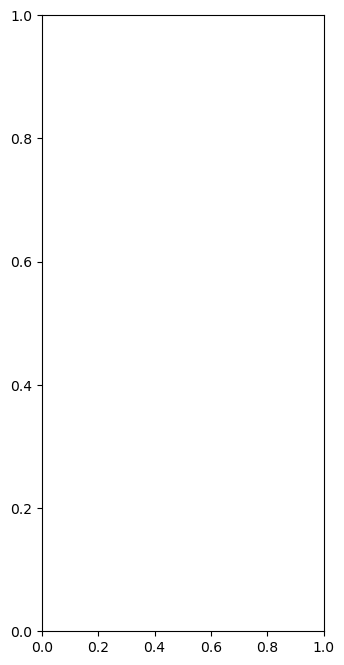

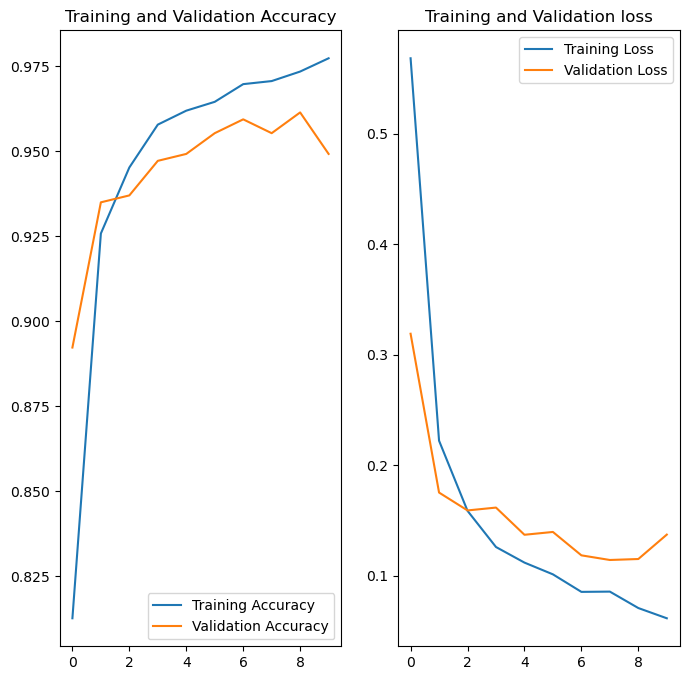

In [14]:
# Plotting
EPOCHS = 10

plt.figure(figsize =(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label = 'Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss, label = 'Training Loss')
plt.plot(range(EPOCHS), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation loss')
plt.show()

In [11]:
model.save("tomatoes97.h5")

In [35]:
from tensorflow.keras.models import load_model

# Load the model
model = load_model("tomatoes97.h5")

# Verify the model structure
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ densenet121 (Functional)             │ (None, 1024)                │       7,037,504 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         262,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 120)                 │          30,840 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │           1,210 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,337,076 (27.99 MB)

 Trainable params: 297,010 (1.13 MB)

 Non-trainable params: 7,040,064 (26.86 MB)

 Optimizer params: 2 (12.00 B)

In [36]:
# Evaluate the model on the validation data
evaluation = model.evaluate(test_data)

# Print the evaluation metrics
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

16/16 ━━━━━━━━━━━━━━━━━━━━ 62s 3s/step - accuracy: 0.9796 - loss: 0.0641
Test Loss: 0.08796447515487671
Test Accuracy: 0.9695122241973877


In [38]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

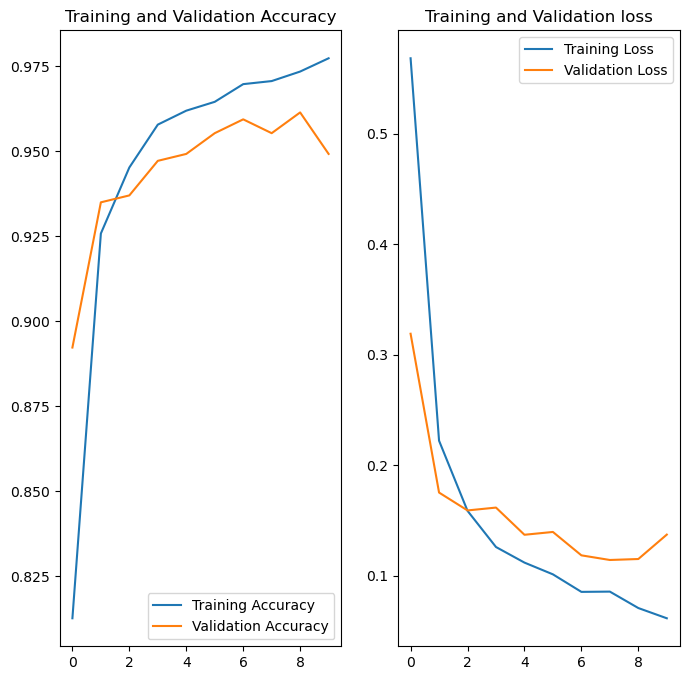

In [37]:
# Plotting
EPOCHS = 10

plt.figure(figsize =(8,8))
plt.subplot(1,2,1)
plt.plot(range(EPOCHS), acc, label = 'Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label = 'Validation Accuracy')
plt.legend(loc = 'lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1,2,2)
plt.plot(range(EPOCHS), loss, label = 'Training Loss')
plt.plot(range(EPOCHS), val_loss, label = 'Validation Loss')
plt.legend(loc = 'upper right')
plt.title('Training and Validation loss')
plt.show()

In [39]:
test_data1 = tf.keras.preprocessing.image_dataset_from_directory(
    'tomato/test',
    labels='inferred',
    label_mode='categorical',
    image_size=(256, 256),
    batch_size=32)

test_data = test_data1.map(lambda x, y: (x / 255.0, y))

Found 492 files belonging to 10 classes.


In [40]:
import numpy as np

# Generate predictions for the test dataset
predictions = model.predict(test_data)

# Convert predicted probabilities to class indices
predicted_class_indices = np.argmax(predictions, axis=1)

16/16 ━━━━━━━━━━━━━━━━━━━━ 64s 4s/step


In [41]:
class_names = test_data1.class_names  # Extract class names before any transformations

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


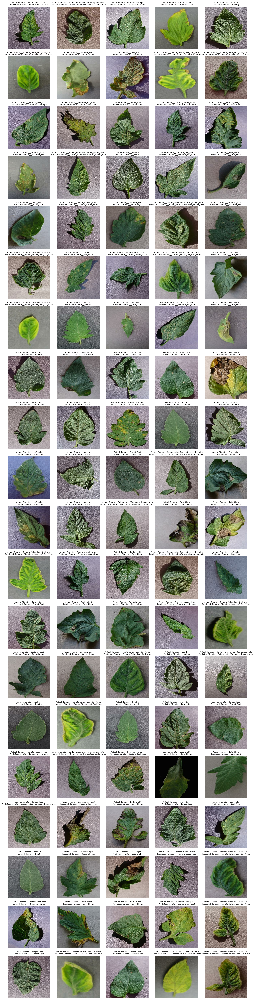

In [42]:
import matplotlib.pyplot as plt
import numpy as np

# Set the number of images to display
num_images_to_display = 100  # Adjust this as needed
images_displayed = 0

# Create a figure to hold the plots
plt.figure(figsize=(15, int(num_images_to_display / 5) * 3))  # Dynamically set figure size

# Iterate through batches of test data
for images, labels in test_data:
    # Predict the classes for the current batch
    batch_predictions = model.predict(images)
    predicted_class_indices = np.argmax(batch_predictions, axis=1)
    actual_class_indices = np.argmax(labels.numpy(), axis=1)

    # Iterate over the current batch
    for i in range(len(images)):
        if images_displayed >= num_images_to_display:
            break

        plt.subplot(int(num_images_to_display / 5), 5, images_displayed + 1)  # Create a grid of 5 images per row
        plt.imshow(images[i].numpy())  # Display the image
        plt.title(
            f"Actual: {class_names[actual_class_indices[i]]}\nPredicted: {class_names[predicted_class_indices[i]]}",
            fontsize=8,
        )
        plt.axis("off")
        images_displayed += 1

    if images_displayed >= num_images_to_display:
        break

# Adjust layout and show the figure
plt.tight_layout()
plt.show()
